In [1]:
from nimbro_vision_server.utils import load_url_b64, visualize_florence2

### Setup

In [2]:
import json
import requests

TOKEN = "super_secret_access_token"
headers = {
    "Authorization": f"Bearer {TOKEN}"
}

# make sure to start a Florence-2 server and use the correct address, port and access token
server_base = "http://localhost:9000"

### Health

In [3]:
url = f"{server_base}/health"

response = requests.get(url)
if response.status_code == 200:
    data = response.json()
    print("Data:", data)
else:
    print("Failed to retrieve health. Status code:", response.status_code)

Data: {'status': 'ok', 'cuda_available': True}


### Model Flavors

In [4]:
url = f"{server_base}/model_flavors"

response = requests.get(url, headers=headers)
if response.status_code == 200:
    data = response.json()
    print("Data:", data)
else:
    print("Failed to retrieve model flavors. Status code:", response.status_code)

Data: {'flavors': ['base', 'large', 'base_ft', 'large_ft']}


### Load Model

* Alternatively use "export FLORENCE2_PRELOAD_FLAVOR=large" before starting the server.
* It is recommended for this model because loading the weights can take up to a minute!

In [5]:
url = f"{server_base}/load"
payload = {'flavor': 'large'}

response = requests.post(url, json=payload, headers=headers)

if response.status_code == 200:
    output = response.json()
    print(output)
else:
    print(f"Request failed with status code: {response.status_code}")

{'loaded_model': 'Model', 'flavor': 'large'}


### Load example for inference endpoint

In [6]:
image_b64_car = load_url_b64("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/car.jpg?download=true")
image_b64_book_cover = load_url_b64("http://ecx.images-amazon.com/images/I/51UUzBDAMsL.jpg?download=true")

### Run inference for various tasks

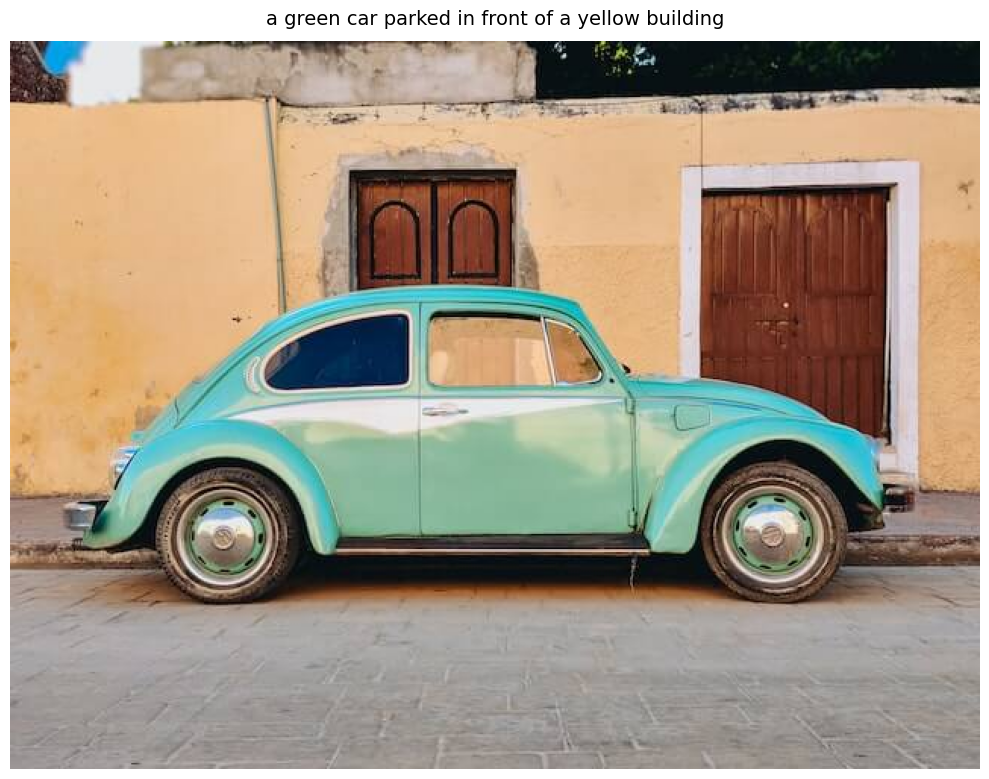

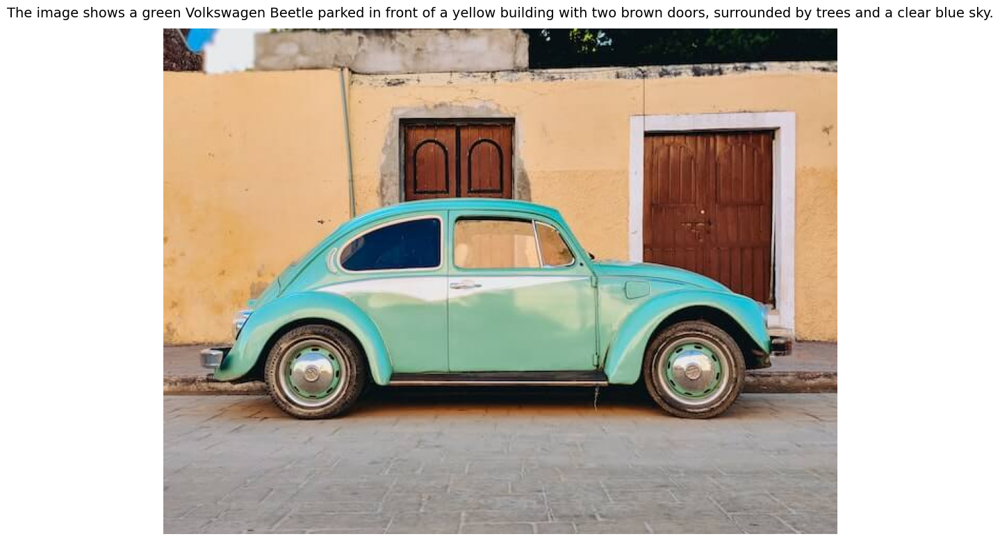

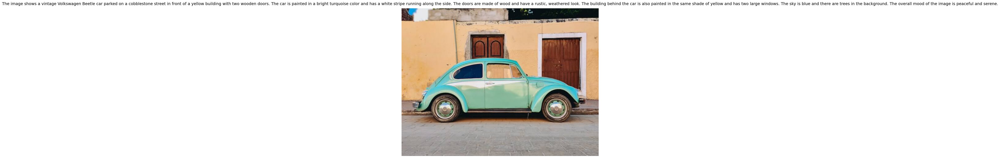

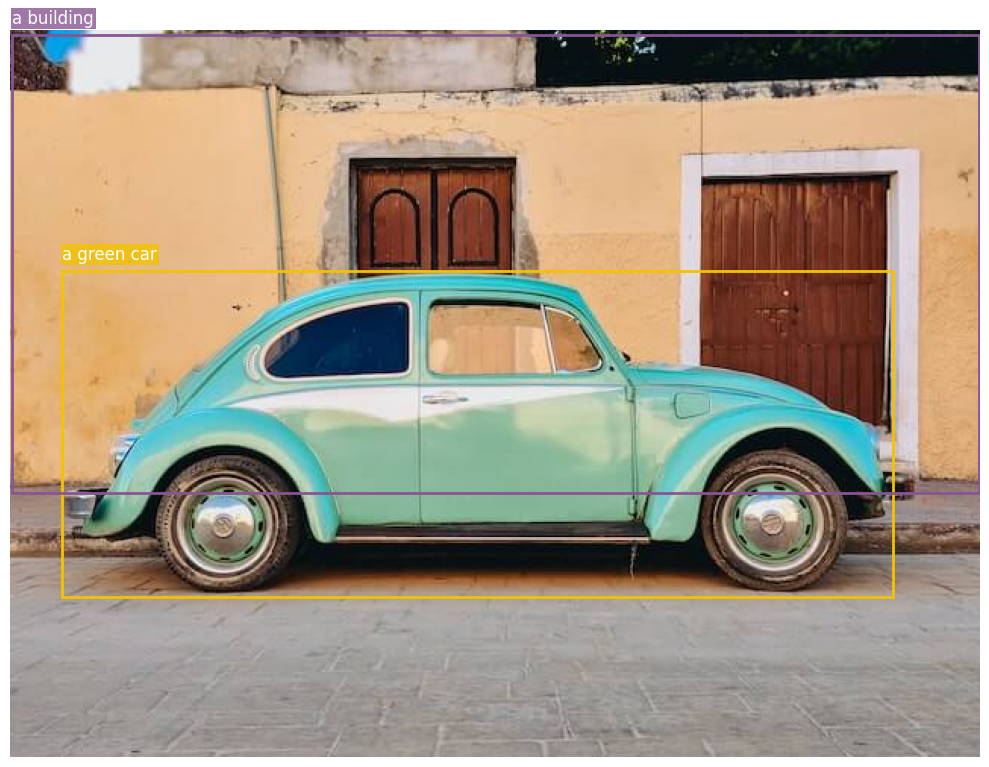

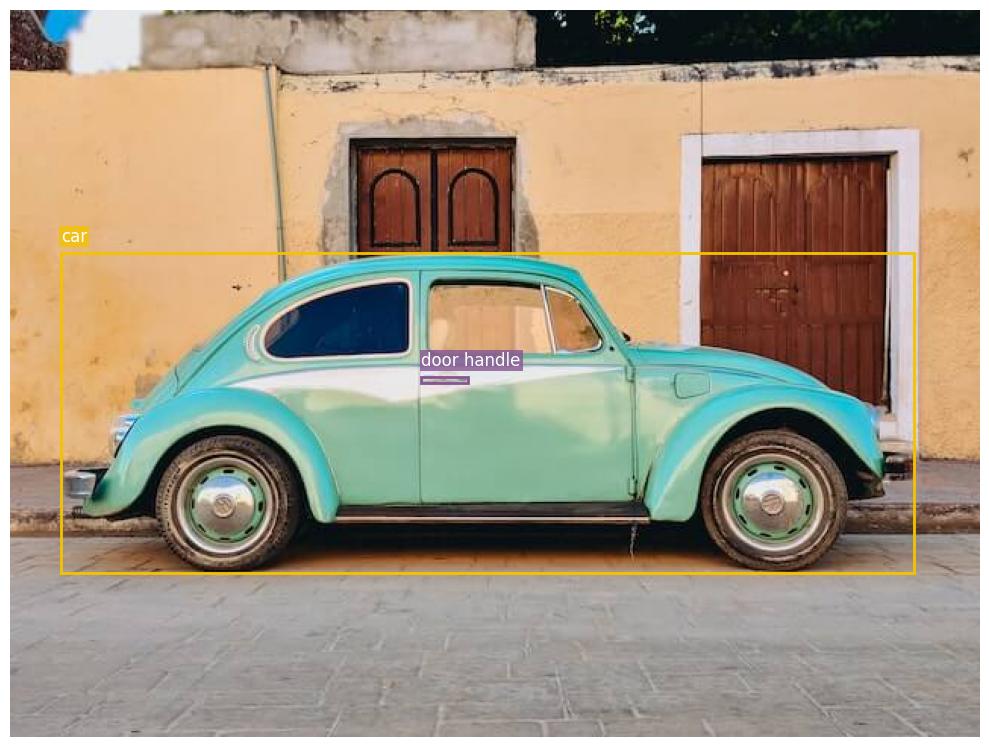

...

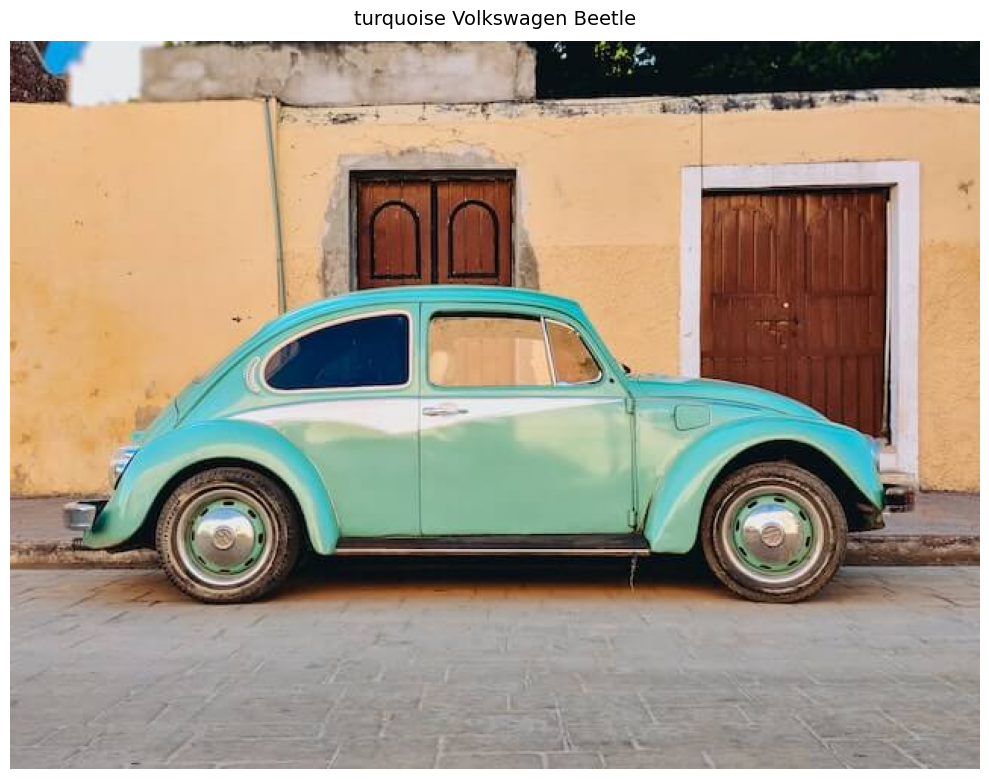

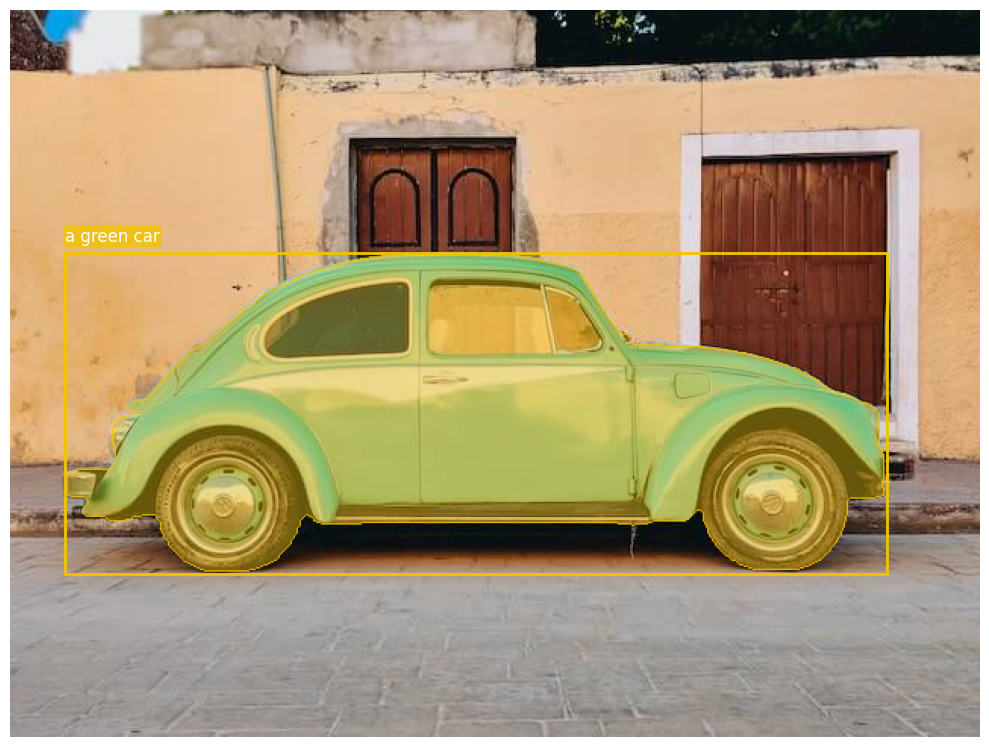

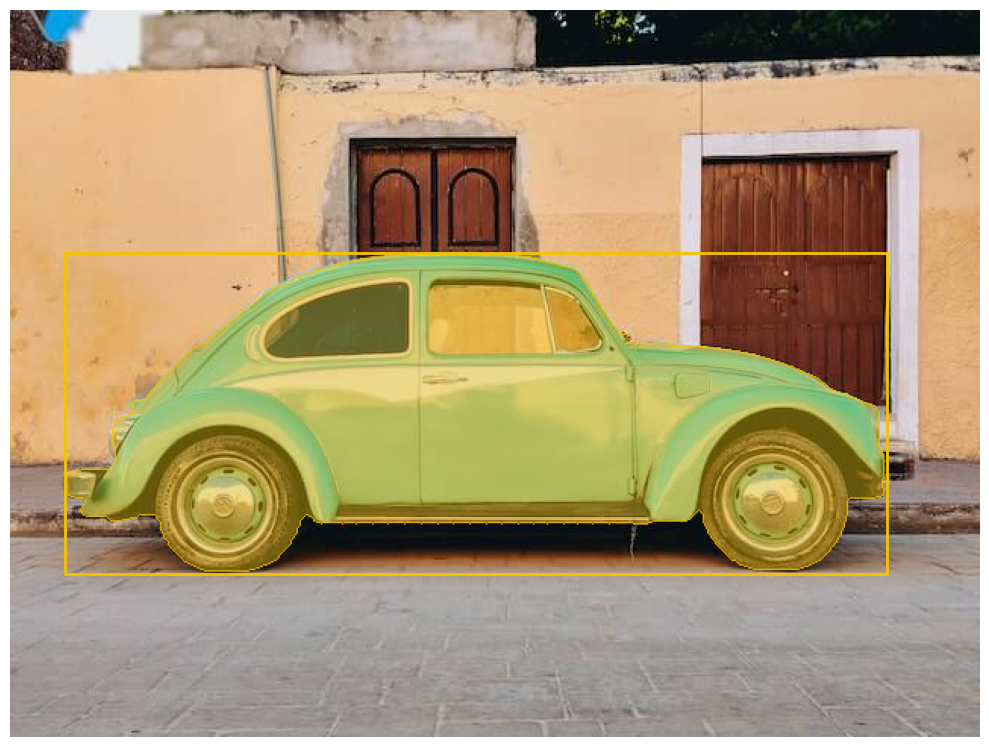

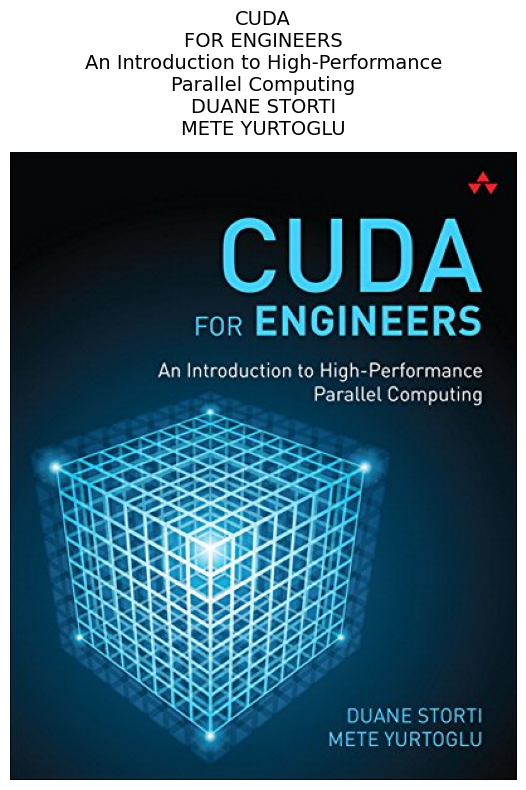

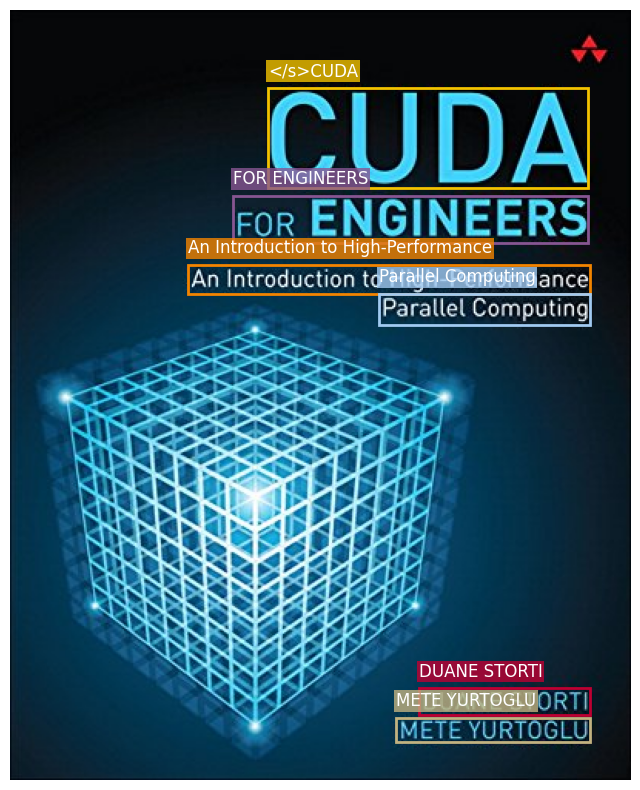

In [7]:
url = f"{server_base}/infer"

prompt_caption = {'task_prompt': "<CAPTION>", 'prompt_args': None}
prompt_caption_detail = {'task_prompt': "<DETAILED_CAPTION>", 'prompt_args': None}
prompt_caption_more_detail = {'task_prompt': "<MORE_DETAILED_CAPTION>", 'prompt_args': None}
prompt_caption_to_phrase_grounding = {'task_prompt': "<CAPTION_TO_PHRASE_GROUNDING>", 'prompt_args': {'caption': 'a green car parked in front of a building'}}
prompt_object_detection = {'task_prompt': "<OD>", 'prompt_args': None}
prompt_dense_region_caption = {'task_prompt': "<DENSE_REGION_CAPTION>", 'prompt_args': None}
prompt_region_proposal = {'task_prompt': "<REGION_PROPOSAL>", 'prompt_args': None}
prompt_open_vocabulary_detection = {'task_prompt': "<OPEN_VOCABULARY_DETECTION>", 'prompt_args': {'phrase': 'a green car'}}
prompt_region_to_category = {'task_prompt': "<REGION_TO_CATEGORY>", 'prompt_args': {'bbox_xyxy': [33, 160, 596, 371]}}
prompt_region_to_description = {'task_prompt': "<REGION_TO_DESCRIPTION>", 'prompt_args': {'bbox_xyxy': [33, 160, 596, 371]}}
prompt_referring_expression_segmentation = {'task_prompt': "<REFERRING_EXPRESSION_SEGMENTATION>", 'prompt_args': {'phrase': 'a green car'}}
prompt_region_to_segmentation = {'task_prompt': "<REGION_TO_SEGMENTATION>", 'prompt_args': {'bbox_xyxy': [33, 160, 596, 371]}}
prompt_ocr = {'task_prompt': "<OCR>", 'prompt_args': None}
prompt_ocr_with_region = {'task_prompt': "<OCR_WITH_REGION>", 'prompt_args': None}

prompts = [prompt_caption, prompt_caption_detail, prompt_caption_more_detail, prompt_caption_to_phrase_grounding, prompt_object_detection,
           prompt_dense_region_caption, prompt_region_proposal, prompt_open_vocabulary_detection, prompt_region_to_category,
           prompt_region_to_description, prompt_referring_expression_segmentation, prompt_region_to_segmentation,
           prompt_ocr, prompt_ocr_with_region]
# each prompt is applied to the corresponding image in the batch
images = [image_b64_car] * 12 + [image_b64_book_cover] * 2

# inference parameters determines the generation settings of the server
inference_parameters = {'max_new_tokens': 1024, 'max_batch_size': 6, 'num_beams': 3}

payload = {'images': images, 'inference_parameters': inference_parameters, 'prompts': prompts}

response = requests.post(url, json=payload, headers=headers)

if response.status_code == 200:
    output = response.json()
else:
    print(f"Request failed with status code: {response.status_code}")

_ = visualize_florence2(payload, output)

### Unload Model

In [8]:
url = f"{server_base}/unload"

response = requests.post(url, headers=headers)

if response.status_code == 200:
    output = response.json()
    print(output)
else:
    print(f"Request failed with status code: {response.status_code}")

{'unloaded': True}


In [9]:
#with open("example_artifact_florence2.json", "w", encoding="utf-8") as f:
#    json.dump(output, f, ensure_ascii=False, indent=4)